In [1]:
import os

import rasterio
# import shapely.geometry
import geojson

from PIL import Image
from transformers import AutoProcessor, AutoModelForCausalLM 

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import spec_defs

from garuda.ops import obb_to_aa

import torch
import torchvision.transforms as transforms
if torch.cuda.is_available():
    device = torch.device("cuda:3")
else:
    device = torch.device("cpu")
    print("CUDA is not available, using CPU")

model = AutoModelForCausalLM.from_pretrained("microsoft/Florence-2-large", trust_remote_code=True, torch_dtype='auto').eval().to(device)
processor = AutoProcessor.from_pretrained("microsoft/Florence-2-large", trust_remote_code=True)

torch_dtype = torch.float16 if torch.cuda.is_available() else torch.float32

/home/nupoor.assudani/anaconda3/envs/nkaenv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-01-24 11:32:29.571426: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1737698549.590810 2323623 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1737698549.596756 2323623 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-24 11:32:29.619594: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in perfo

In [2]:
def zero_shot_bbox(image_path, label_path, task, text):
    metadata_path = "/home/patel_zeel/kiln_compass_24/data/lucknow_airshed/metadata.geojson"
    with open(metadata_path) as f:
        metadata = geojson.load(f) # loading metadat
    image_tensor,label_tensor, image_metadata = spec_defs.load_image_and_label(image_path, label_path, metadata) # loading image and labels
    image_np = image_tensor.permute(1, 2, 0).cpu().numpy() # creating np array of image
    height, width, _ = image_np.shape # finding height and width of image in pixels
    image = Image.fromarray((image_np * 255).astype(np.uint8))  # Convert back to 8-bit per channel
    text_prompt = task + text # creating prompt to give to model
    inputs = processor(text = text_prompt, images=image, return_tensors="pt").to(device, torch_dtype) # giving input to model
    generated_ids = model.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=4096,
        num_beams=3,
        do_sample=False
    )
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0] # model output
    od_parsed = processor.post_process_generation(generated_text, task=task, image_size=(image.width, image.height))
    # print(od_parsed)
    model_op = od_parsed[task] # relevant portion of model output
    print(model_op) #
    op_bboxes = model_op['bboxes'] # bounding boxes in [xmin, ymin, xmax, ymax] format
    if task == "<OPEN_VOCABULARY_DETECTION>":
        op_labels = model_op['bboxes_labels'] # labels
    else:
        op_labels = model_op['labels'] #labels
    return image, op_labels, op_bboxes, label_tensor, image_metadata, height, width

In [3]:
def box_area(box): # box in [xmin, ymin, xmax, ymax] format
    return (box[2] - box[0]) * (box[3] - box[1]) # calculating area

def convert_to_xyxy(box, h_im, w_im): # box: [label, x_center, y_center, width, height], YOLO aa format
    x_center, y_center, width, height = box[1], box[2], box[3], box[4]
    x_min = (x_center - width / 2) * w_im # scaling to image size
    y_min = (y_center - height / 2) * h_im
    x_max = (x_center + width / 2) * w_im
    y_max = (y_center + height / 2) * h_im
    return [x_min, y_min, x_max, y_max]

def calc_iou(box_a, box_b, h_im, w_im):
    if len(box_b) > 4: # box_b is in YOLO aa format [label, x_center, y_center, width, height]
        box_b = convert_to_xyxy(box_b, h_im, w_im)
    box_a = np.array(box_a)
    box_b = np.array(box_b)
    
    area_a = box_area(box_a)
    area_b = box_area(box_b)
    
    top_left = np.maximum(box_a[:2], box_b[:2]) # finding overlap
    bottom_right = np.minimum(box_a[2:], box_b[2:])
    area_inter = np.prod(np.clip(bottom_right - top_left, a_min=0, a_max=None))
    
    return abs(area_inter) / (abs(area_a) + abs(area_b) - abs(area_inter))

In [4]:
def match_boxes(pred_boxes, gt_boxes, h_im, w_im, iou_threshold):
    matches =[]
    gt_kilns = [0]*len(gt_boxes)
    for pred in pred_boxes:
        for i, gt in enumerate(gt_boxes): # iterating over gt boxes
            iou_score = calc_iou(pred, gt, h_im, w_im) # calc iou score
            if iou_score >= iou_threshold: # checking for overlap
                matches.append((pred, gt_boxes[i])) # mark as correct prediction
                gt_kilns[i] = 1
    kilns_found = 0
    for i in gt_kilns:
        if i==1:
            kilns_found += 1
    return matches, kilns_found

In [5]:
def compare_gt_pred(image_path, aa_label_path, task, text, iou_th, plot_results = False):
    image, op_labels, pred_boxes, label_tensor, image_metadata, height, width = zero_shot_bbox(image_path, aa_label_path, task, text)
    with open(aa_label_path):
        gt_boxes = np.loadtxt(aa_label_path, ndmin=2)

    matched_pairs, kilns_found = match_boxes(pred_boxes, gt_boxes, height, width, iou_th)
    gt_num = len(gt_boxes)
    pred_num = len(pred_boxes)
    num_corr = len(matched_pairs)

    # prec = num_corr/pred_num
    # rec = num_corr/gt_num
    # f1 = 2/((1/prec)+(1/rec))

    if plot_results == True:
        fig, ax = plt.subplots(1, 2, figsize=(10, 5)) # creating 2 plots, one for actual, one for predicted

        ax[0].imshow(image)
        for bbox in gt_boxes:
            bbox_f = convert_to_xyxy(bbox, height, width)
            x1, y1, x2, y2 = bbox_f
            # print(bbox_f)
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor='b', facecolor='none')
            ax[0].add_patch(rect)  # Add the rectangle to the Axes         
        
        ax[1].imshow(image)
        for bbox, label in zip(pred_boxes, op_labels): 
            x1, y1, x2, y2 = bbox 
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor='r', facecolor='none')
            ax[1].add_patch(rect)  # Add the rectangle to the Axes 
            plt.text(x1, y1, label, color='white', fontsize=8, bbox=dict(facecolor='red', alpha=0.5))   # label    
 
        ax[0].axis('off')  
        ax[1].axis('off') 
        plt.show()
    return gt_num, pred_num, num_corr, kilns_found

In [12]:
images_folder = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/vlm_data/uttar_pradesh_most_15/swinir_images"
labels_folder = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/vlm_data/uttar_pradesh_most_15/labels"
aa_labels_folder = "/home/nupoor.assudani/cs299_main/up_most_15_aa_labels"
image_names = ['8594276_3380960.png', '8619041_3342435.png', '8652062_3221359.png', '9020794_3116793.png',
               '9238181_2893903.png', '8608034_3419484.png', '8621793_3345187.png', '8987773_3138807.png',
               '9103346_3169076.png', '9238181_2896655.png', '8610786_3347939.png', '8652062_3218607.png',
               '8998780_3083773.png', '9185898_3075517.png', '9240933_2896655.png']
label_names = []
for name in image_names:
    label_names.append(name[:-4]+'.txt')

In [7]:
tap1 = "<OD>"
tep1 = ""
tap2 = "<OPEN_VOCABULARY_DETECTION>"
tep2 = "brick kiln with chimney"
tap3 = "<OPEN_VOCABULARY_DETECTION>"
tep3 = "chimneys and brick kilns"
tap4 = "<OPEN_VOCABULARY_DETECTION>"
tep4 = "Aerial view of multiple brick kilns in operation, some oval and others circular, all emitting smoke. The kilns are close together, surrounded by fields, roads, and vegetation."
tap5 = "<OPEN_VOCABULARY_DETECTION>"
tep5 = "top-down satellite image of an oval-shaped brick kiln."
tap6 = "<OPEN_VOCABULARY_DETECTION>"
tep6 = "An oval-shaped traditional brick kiln in a vast rural area."
tap7 = "<OPEN_VOCABULARY_DETECTION>"
tep7 = "brick kilns"
tap8 = "<CAPTION_TO_PHRASE_GROUNDING>"
tep8 = "Aerial view of multiple brick kilns in operation, some oval and others circular, all emitting smoke. The kilns are close together, surrounded by fields, roads, and vegetation."
tap9 = "<CAPTION_TO_PHRASE_GROUNDING>"
tep9 = "An oval-shaped traditional brick kiln in a vast rural area."
tap10 = "<CAPTION_TO_PHRASE_GROUNDING>"
tep10 = "top-down satellite image of an oval-shaped brick kiln."
tap11 = "<CAPTION_TO_PHRASE_GROUNDING>"
tep11 = "brick kilns in a rural area"
tap12 = "<CAPTION_TO_PHRASE_GROUNDING>"
tep12 = "brick kilns with chimneys"
tap13 = "<CAPTION_TO_PHRASE_GROUNDING>"
tep13 = "fields, factory, roads and brick kilns"
tap14 = "<CAPTION_TO_PHRASE_GROUNDING>"
tep14 = "Satellite image of rural area with factories, trees, fields, brick kilns with chimneys and roads"
tap15 = "<CAPTION_TO_PHRASE_GROUNDING>"
tep15 = "chimneys and brick kilns"

task_prompts = [tap1, tap2, tap3, tap4, tap5, tap6, tap7, tap8, tap9, tap10, tap11, tap12, tap13, tap14, tap15]
text_prompts = [tep1, tep2, tep3, tep4, tep5, tep6, tep7, tep8, tep9, tep10, tep11, tep12, tep13, tep14, tep15]


Text prompt: <OPEN_VOCABULARY_DETECTION>Aerial view of multiple brick kilns in operation, some oval and others circular, all emitting smoke. The kilns are close together, surrounded by fields, roads, and vegetation.
IoU threshold: 0.1
{'bboxes': [[1.2799999713897705, 1.2799999713897705, 2558.719970703125, 2558.719970703125]], 'bboxes_labels': ['Aerial view of multiple brick kilns in operation, some oval and others circular, all emitting smoke. The kilns are close together, surrounded by fields, roads, and vegetation.'], 'polygons': [], 'polygons_labels': []}


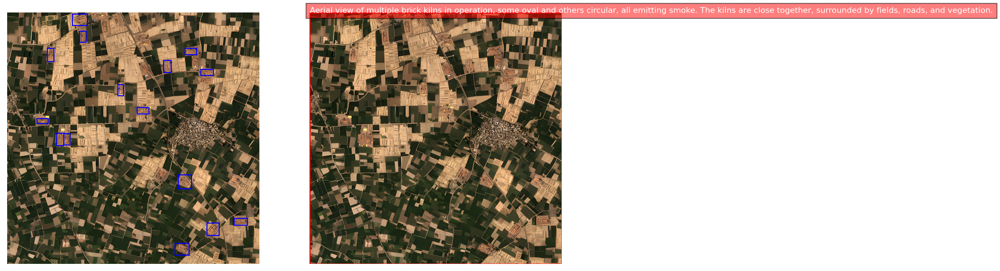

{'bboxes': [[1.2799999713897705, 1.2799999713897705, 2558.719970703125, 2558.719970703125]], 'bboxes_labels': ['Aerial view of multiple brick kilns in operation, some oval and others circular, all emitting smoke. The kilns are close together, surrounded by fields, roads, and vegetation.'], 'polygons': [], 'polygons_labels': []}
{'bboxes': [[1056.0, 413.44000244140625, 1598.719970703125, 884.47998046875]], 'bboxes_labels': ['Aerial view of multiple brick kilns in operation, some oval and others circular, all emitting smoke. The kilns are close together, surrounded by fields, roads, and vegetation.'], 'polygons': [], 'polygons_labels': []}
{'bboxes': [[1.2799999713897705, 1.2799999713897705, 2558.719970703125, 2558.719970703125]], 'bboxes_labels': ['Aerial view of multiple brick kilns in operation, some oval and others circular, all emitting smoke. The kilns are close together, surrounded by fields, roads, and vegetation.'], 'polygons': [], 'polygons_labels': []}
{'bboxes': [[1.279999971

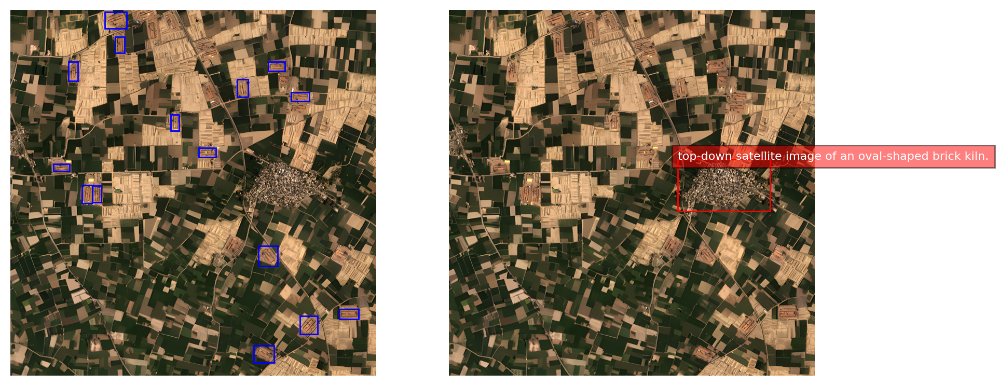

{'bboxes': [[1.2799999713897705, 1.2799999713897705, 2558.719970703125, 2558.719970703125]], 'bboxes_labels': ['top-down satellite image of an oval-shaped brick kiln.'], 'polygons': [], 'polygons_labels': []}
{'bboxes': [[1053.43994140625, 413.44000244140625, 1598.719970703125, 884.47998046875]], 'bboxes_labels': ['top-down satellite image of an oval-shaped brick kiln.'], 'polygons': [], 'polygons_labels': []}
{'bboxes': [[1.2799999713897705, 1.2799999713897705, 2558.719970703125, 2558.719970703125]], 'bboxes_labels': ['top-down satellite image of an oval-shaped brick kiln.'], 'polygons': [], 'polygons_labels': []}
{'bboxes': [[193.27999877929688, 1393.919921875, 515.8399658203125, 1900.7999267578125]], 'bboxes_labels': ['top-down satellite image of an oval-shaped brick kiln.'], 'polygons': [], 'polygons_labels': []}
{'bboxes': [[541.4400024414062, 1834.239990234375, 1061.1199951171875, 2330.8798828125]], 'bboxes_labels': ['top-down satellite image of an oval-shaped brick kiln.'], 'pol

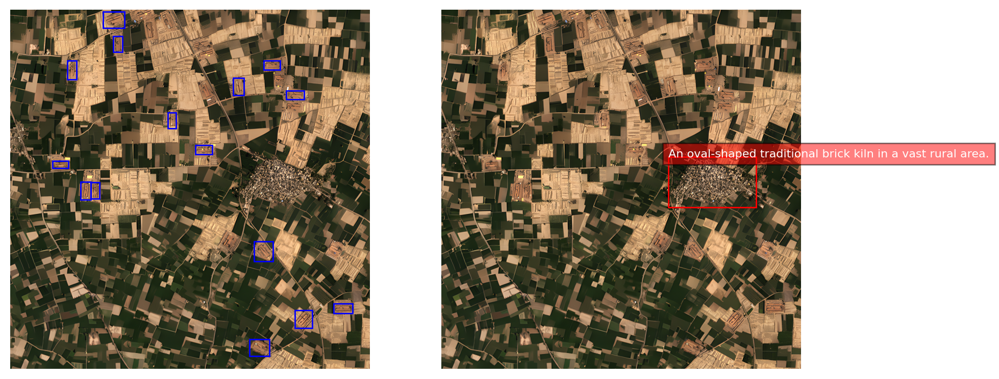

{'bboxes': [[1.2799999713897705, 1.2799999713897705, 2558.719970703125, 2558.719970703125]], 'bboxes_labels': ['An oval-shaped traditional brick kiln in a vast rural area.'], 'polygons': [], 'polygons_labels': []}
{'bboxes': [[1056.0, 413.44000244140625, 1598.719970703125, 884.47998046875]], 'bboxes_labels': ['An oval-shaped traditional brick kiln in a vast rural area.'], 'polygons': [], 'polygons_labels': []}
{'bboxes': [[1.2799999713897705, 1.2799999713897705, 2558.719970703125, 2558.719970703125]], 'bboxes_labels': ['An oval-shaped traditional brick kiln in a vast rural area.'], 'polygons': [], 'polygons_labels': []}
{'bboxes': [[1.2799999713897705, 1.2799999713897705, 2558.719970703125, 2558.719970703125]], 'bboxes_labels': ['An oval-shaped traditional brick kiln in a vast rural area.'], 'polygons': [], 'polygons_labels': []}
{'bboxes': [[541.4400024414062, 1834.239990234375, 1061.1199951171875, 2330.8798828125]], 'bboxes_labels': ['An oval-shaped traditional brick kiln in a vast r

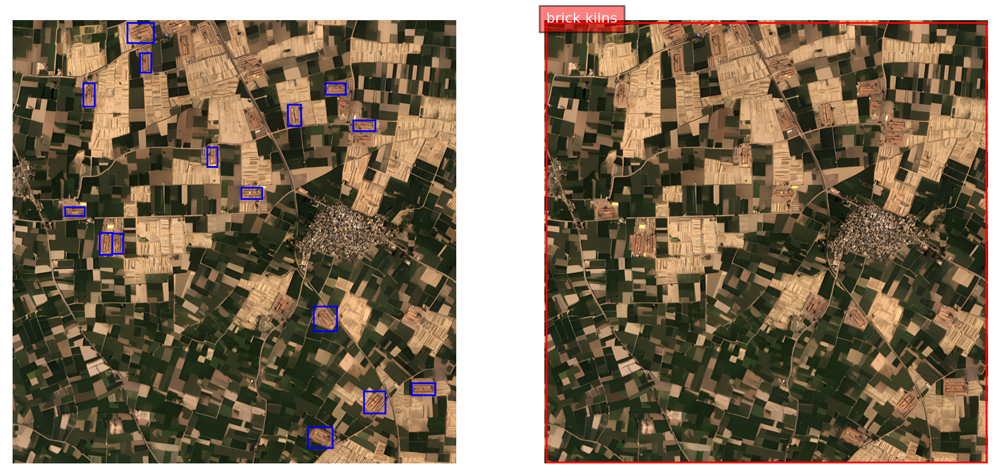

{'bboxes': [[1.2799999713897705, 1.2799999713897705, 2558.719970703125, 2558.719970703125]], 'bboxes_labels': ['brick kilns'], 'polygons': [], 'polygons_labels': []}
{'bboxes': [[8.960000038146973, 8.960000038146973, 2548.47998046875, 2553.599853515625]], 'bboxes_labels': ['brick kilns'], 'polygons': [], 'polygons_labels': []}
{'bboxes': [[8.960000038146973, 8.960000038146973, 2548.47998046875, 2553.599853515625]], 'bboxes_labels': ['brick kilns'], 'polygons': [], 'polygons_labels': []}
{'bboxes': [[8.960000038146973, 11.519999504089355, 2548.47998046875, 2551.0400390625]], 'bboxes_labels': ['brick kilns'], 'polygons': [], 'polygons_labels': []}
{'bboxes': [[8.960000038146973, 11.519999504089355, 2545.919921875, 2551.0400390625]], 'bboxes_labels': ['brick kilns'], 'polygons': [], 'polygons_labels': []}
{'bboxes': [[8.960000038146973, 11.519999504089355, 2545.919921875, 2551.0400390625]], 'bboxes_labels': ['brick kilns'], 'polygons': [], 'polygons_labels': []}
{'bboxes': [[8.96000003814

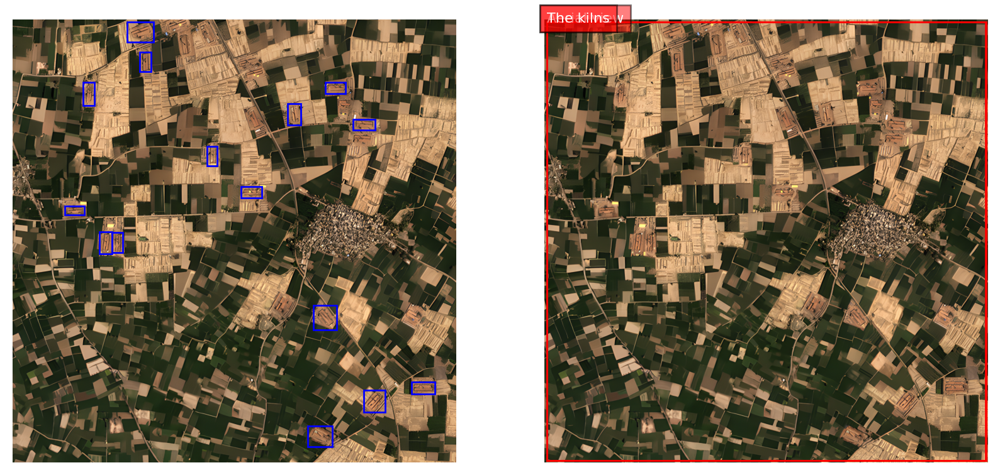

{'bboxes': [[11.519999504089355, 11.519999504089355, 2548.47998046875, 2551.0400390625], [8.960000038146973, 8.960000038146973, 2548.47998046875, 2551.0400390625], [11.519999504089355, 11.519999504089355, 2545.919921875, 2551.0400390625], [1744.6400146484375, 1286.4000244140625, 2553.599853515625, 1667.8399658203125]], 'labels': ['Aerial view', 'multiple brick kilns', 'The kilns', 'roads']}
{'bboxes': [[11.519999504089355, 11.519999504089355, 2548.47998046875, 2551.0400390625], [11.519999504089355, 8.960000038146973, 2548.47998046875, 2553.599853515625], [14.079999923706055, 11.519999504089355, 2545.919921875, 2551.0400390625], [387.8399963378906, 8.960000038146973, 1050.8800048828125, 2551.0400390625]], 'labels': ['Aerial view', 'multiple brick kilns', 'The kilns', 'roads']}
{'bboxes': [[14.079999923706055, 14.079999923706055, 2548.47998046875, 2551.0400390625]], 'labels': ['Aerial view']}
{'bboxes': [[11.519999504089355, 14.079999923706055, 2548.47998046875, 2548.47998046875]], 'labe

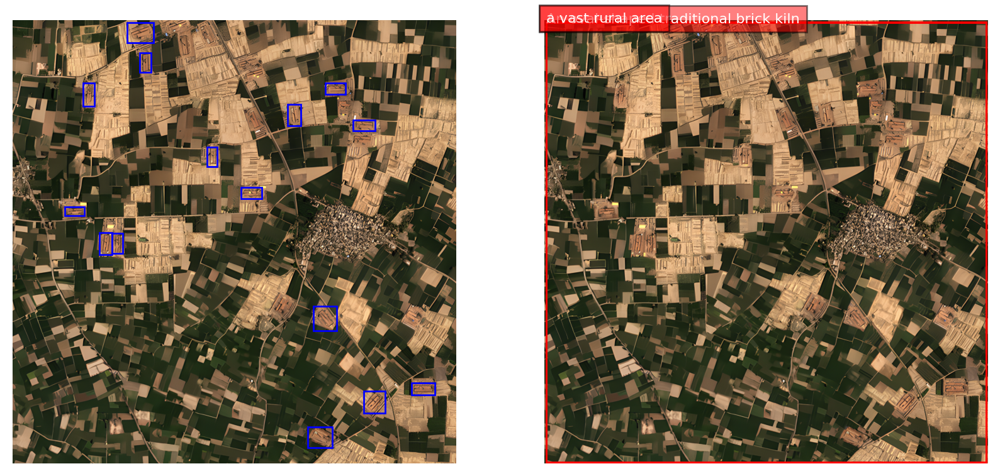

{'bboxes': [[8.960000038146973, 8.960000038146973, 2548.47998046875, 2551.0400390625], [8.960000038146973, 8.960000038146973, 2551.0400390625, 2553.599853515625]], 'labels': ['An oval-shaped traditional brick kiln', 'a vast rural area']}
{'bboxes': [[11.519999504089355, 8.960000038146973, 2548.47998046875, 2551.0400390625], [8.960000038146973, 8.960000038146973, 2548.47998046875, 2553.599853515625]], 'labels': ['An oval-shaped traditional brick kiln', 'a vast rural area']}
{'bboxes': [[11.519999504089355, 11.519999504089355, 2548.47998046875, 2551.0400390625], [8.960000038146973, 8.960000038146973, 2548.47998046875, 2553.599853515625]], 'labels': ['An oval-shaped traditional brick kiln', 'a vast rural area']}
{'bboxes': [[8.960000038146973, 11.519999504089355, 2548.47998046875, 2548.47998046875], [8.960000038146973, 11.519999504089355, 2551.0400390625, 2551.0400390625]], 'labels': ['An oval-shaped traditional brick kiln', 'a vast rural area']}
{'bboxes': [[8.960000038146973, 11.5199995

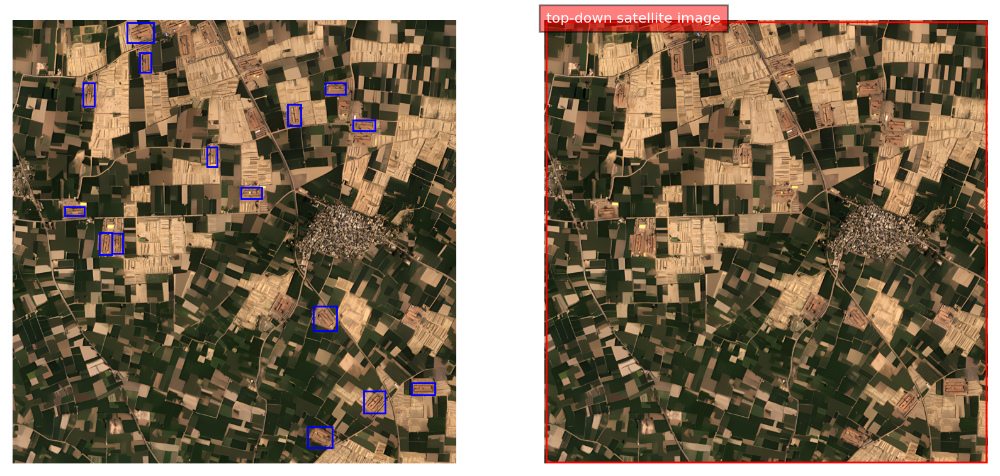

{'bboxes': [[8.960000038146973, 6.399999618530273, 2551.0400390625, 2551.0400390625], [6.399999618530273, 6.399999618530273, 2551.0400390625, 2553.599853515625]], 'labels': ['top-down satellite image', 'an oval-shaped brick kiln']}
{'bboxes': [[11.519999504089355, 6.399999618530273, 2548.47998046875, 2551.0400390625]], 'labels': ['top-down satellite image']}
{'bboxes': [[11.519999504089355, 8.960000038146973, 2548.47998046875, 2551.0400390625]], 'labels': ['top-down satellite image']}
{'bboxes': [[11.519999504089355, 11.519999504089355, 2548.47998046875, 2548.47998046875]], 'labels': ['top-down satellite image']}
{'bboxes': [[8.960000038146973, 8.960000038146973, 2548.47998046875, 2551.0400390625]], 'labels': ['top-down satellite image']}
{'bboxes': [[8.960000038146973, 8.960000038146973, 2548.47998046875, 2551.0400390625]], 'labels': ['top-down satellite image']}
{'bboxes': [[8.960000038146973, 8.960000038146973, 2548.47998046875, 2551.0400390625]], 'labels': ['top-down satellite imag

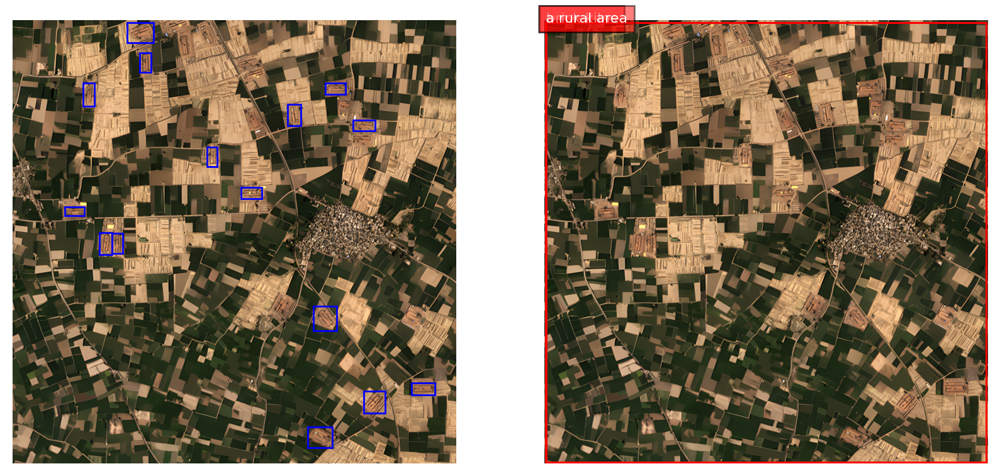

{'bboxes': [[8.960000038146973, 8.960000038146973, 2548.47998046875, 2551.0400390625], [6.399999618530273, 8.960000038146973, 2548.47998046875, 2553.599853515625]], 'labels': ['brick kilns', 'a rural area']}
{'bboxes': [[11.519999504089355, 8.960000038146973, 2548.47998046875, 2551.0400390625], [8.960000038146973, 8.960000038146973, 2548.47998046875, 2553.599853515625]], 'labels': ['brick kilns', 'a rural area']}
{'bboxes': [[11.519999504089355, 11.519999504089355, 2548.47998046875, 2551.0400390625], [8.960000038146973, 11.519999504089355, 2548.47998046875, 2553.599853515625]], 'labels': ['brick kilns', 'a rural area']}
{'bboxes': [[8.960000038146973, 11.519999504089355, 2548.47998046875, 2551.0400390625], [8.960000038146973, 11.519999504089355, 2551.0400390625, 2553.599853515625]], 'labels': ['brick kilns', 'a rural area']}
{'bboxes': [[8.960000038146973, 11.519999504089355, 2545.919921875, 2551.0400390625], [8.960000038146973, 11.519999504089355, 2548.47998046875, 2553.599853515625]]

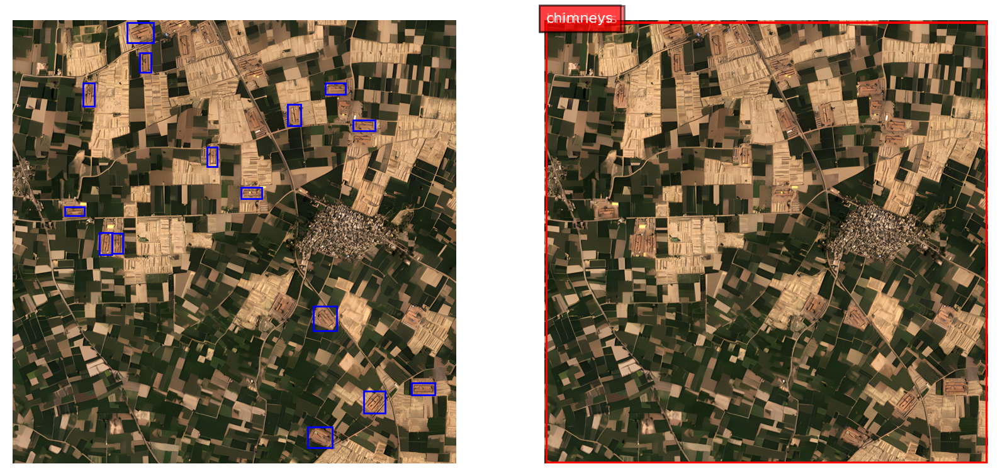

{'bboxes': [[8.960000038146973, 8.960000038146973, 2548.47998046875, 2551.0400390625], [8.960000038146973, 6.399999618530273, 2548.47998046875, 2553.599853515625]], 'labels': ['brick kilns', 'chimneys']}
{'bboxes': [[11.519999504089355, 8.960000038146973, 2548.47998046875, 2551.0400390625]], 'labels': ['brick kilns']}
{'bboxes': [[14.079999923706055, 11.519999504089355, 2548.47998046875, 2551.0400390625]], 'labels': ['brick kilns']}
{'bboxes': [[11.519999504089355, 14.079999923706055, 2548.47998046875, 2543.35986328125]], 'labels': ['brick kilns']}
{'bboxes': [[8.960000038146973, 11.519999504089355, 2545.919921875, 2551.0400390625], [8.960000038146973, 8.960000038146973, 2545.919921875, 2551.0400390625]], 'labels': ['brick kilns', 'chimneys']}
{'bboxes': [[8.960000038146973, 8.960000038146973, 2548.47998046875, 2551.0400390625], [6.399999618530273, 11.519999504089355, 1424.6400146484375, 2551.0400390625], [8.960000038146973, 1534.719970703125, 1419.52001953125, 2553.599853515625], [8.9

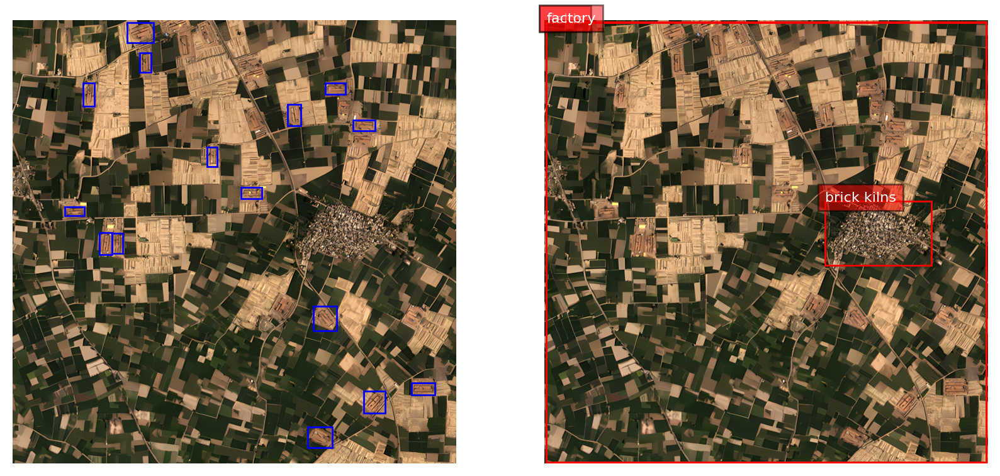

{'bboxes': [[8.960000038146973, 8.960000038146973, 2548.47998046875, 2551.0400390625], [6.399999618530273, 8.960000038146973, 2551.0400390625, 2553.599853515625], [1742.0799560546875, 1286.4000244140625, 2553.599853515625, 1667.8399658203125], [8.960000038146973, 8.960000038146973, 2551.0400390625, 2551.0400390625]], 'labels': ['fields', 'factory', 'roads', 'brick kilns']}
{'bboxes': [[8.960000038146973, 8.960000038146973, 2548.47998046875, 2553.599853515625], [8.960000038146973, 8.960000038146973, 2551.0400390625, 2553.599853515625], [387.8399963378906, 8.960000038146973, 1050.8800048828125, 2553.599853515625], [8.960000038146973, 945.9199829101562, 674.5599975585938, 1542.4000244140625], [1056.0, 408.3199768066406, 1601.2799072265625, 897.2799682617188], [451.8399963378906, 6.399999618530273, 945.9199829101562, 405.7599792480469], [961.2799682617188, 853.760009765625, 1324.7999267578125, 1196.7999267578125], [1409.280029296875, 797.4400024414062, 1711.3599853515625, 1125.119995117187

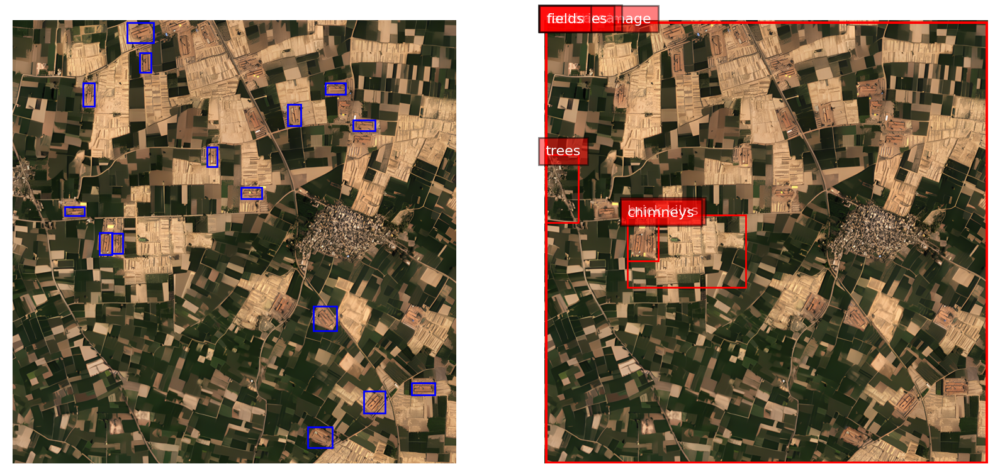

{'bboxes': [[6.399999618530273, 8.960000038146973, 2551.0400390625, 2551.0400390625], [6.399999618530273, 6.399999618530273, 2551.0400390625, 2553.599853515625], [8.960000038146973, 8.960000038146973, 2548.47998046875, 2551.0400390625], [8.960000038146973, 1463.0399169921875, 1529.5999755859375, 2551.0400390625], [625.9199829101562, 1463.0399169921875, 776.9599609375, 1698.5599365234375], [1742.0799560546875, 1286.4000244140625, 2553.599853515625, 1667.8399658203125]], 'labels': ['Satellite image', 'rural area', 'factories', 'brick kilns', 'chimneys', 'roads']}
{'bboxes': [[8.960000038146973, 11.519999504089355, 2548.47998046875, 2551.0400390625], [8.960000038146973, 8.960000038146973, 2548.47998046875, 2553.599853515625], [8.960000038146973, 8.960000038146973, 2551.0400390625, 2553.599853515625], [1053.43994140625, 408.3199768066406, 1601.2799072265625, 907.5199584960938], [8.960000038146973, 8.960000038146973, 2545.919921875, 2553.599853515625], [8.960000038146973, 945.9199829101562,

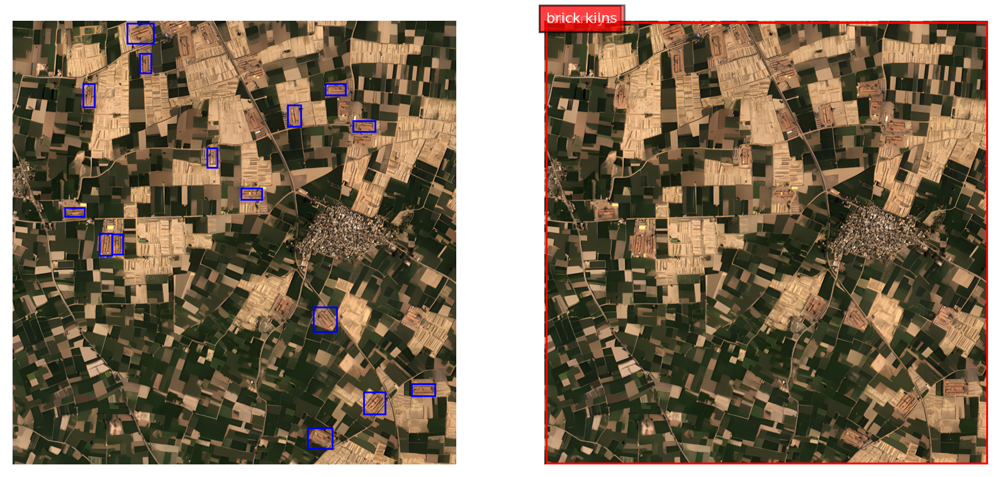

{'bboxes': [[8.960000038146973, 6.399999618530273, 2551.0400390625, 2551.0400390625], [6.399999618530273, 6.399999618530273, 2551.0400390625, 2553.599853515625]], 'labels': ['chimneys', 'brick kilns']}
{'bboxes': [[8.960000038146973, 6.399999618530273, 2551.0400390625, 2551.0400390625], [8.960000038146973, 8.960000038146973, 2551.0400390625, 2553.599853515625]], 'labels': ['chimneys', 'brick kilns']}
{'bboxes': [[14.079999923706055, 8.960000038146973, 2548.47998046875, 2551.0400390625], [11.519999504089355, 8.960000038146973, 2548.47998046875, 2553.599853515625]], 'labels': ['chimneys', 'brick kilns']}
{'bboxes': [[8.960000038146973, 8.960000038146973, 2551.0400390625, 2548.47998046875]], 'labels': ['chimneys']}
{'bboxes': [[6.399999618530273, 6.399999618530273, 2548.47998046875, 2551.0400390625], [6.399999618530273, 6.399999618530273, 2551.0400390625, 2553.599853515625]], 'labels': ['chimneys', 'brick kilns']}
{'bboxes': [[8.960000038146973, 6.399999618530273, 2548.47998046875, 2551.0

In [14]:
gt_kilns = 155 # calculated through previous tests
pred_kilns = [0]*15
corr_preds = [0]*15
kilns_found_list = [0]*15
iou_th = 0.1
for x in range(3,15):
    print()
    print("Text prompt:", task_prompts[x] + text_prompts[x])
    print("IoU threshold:", iou_th)
    for i in range(15):
        im_path = images_folder + "/" + image_names[i]
        lab_path = aa_labels_folder + "/" + label_names[i]
        if i==0:
            gt_num, pred_num, num_corr, kilns_found = compare_gt_pred(im_path, lab_path, task_prompts[x], text_prompts[x], iou_th, plot_results = True)
        else:
            gt_num, pred_num, num_corr, kilns_found = compare_gt_pred(im_path, lab_path, task_prompts[x], text_prompts[x], iou_th)
        pred_kilns[x]+=pred_num
        corr_preds[x]+=num_corr
        kilns_found_list[x]+=kilns_found
    print('Actual number of kilns =', gt_kilns)
    print("Predicted number of kilns =", pred_kilns[x])
    print("Number of predictions that matched with ground truth kilns =", corr_preds[x])
    print("Number of kilns identified correctly =", kilns_found_list[x])
    print()
    if corr_preds[x]!=0:
        prec = corr_preds[x]/pred_kilns[x]
        print("Precision =", prec)
        rec = kilns_found_list[x]/gt_kilns
        print("Recall =", rec)
        f1 = 2*prec*rec/(prec+rec)
        print("F1 score =", f1)